I did some basic EDA in addition to the EDA in my other notebook. Just to visualize other relationships.

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import skew

from sklearn.linear_model import LinearRegression,Lasso,Ridge,ElasticNet
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import mean_squared_error
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PowerTransformer
from sklearn.compose import make_column_transformer
from sklearn.compose import make_column_selector as selector
from sklearn.neighbors import KNeighborsRegressor
from sklearn.dummy import DummyRegressor

In [4]:
import sklearn 
sklearn.set_config(display='diagram')

In [7]:
train = pd.read_csv("../datasets/train.csv")
test = pd.read_csv("../datasets/test.csv")

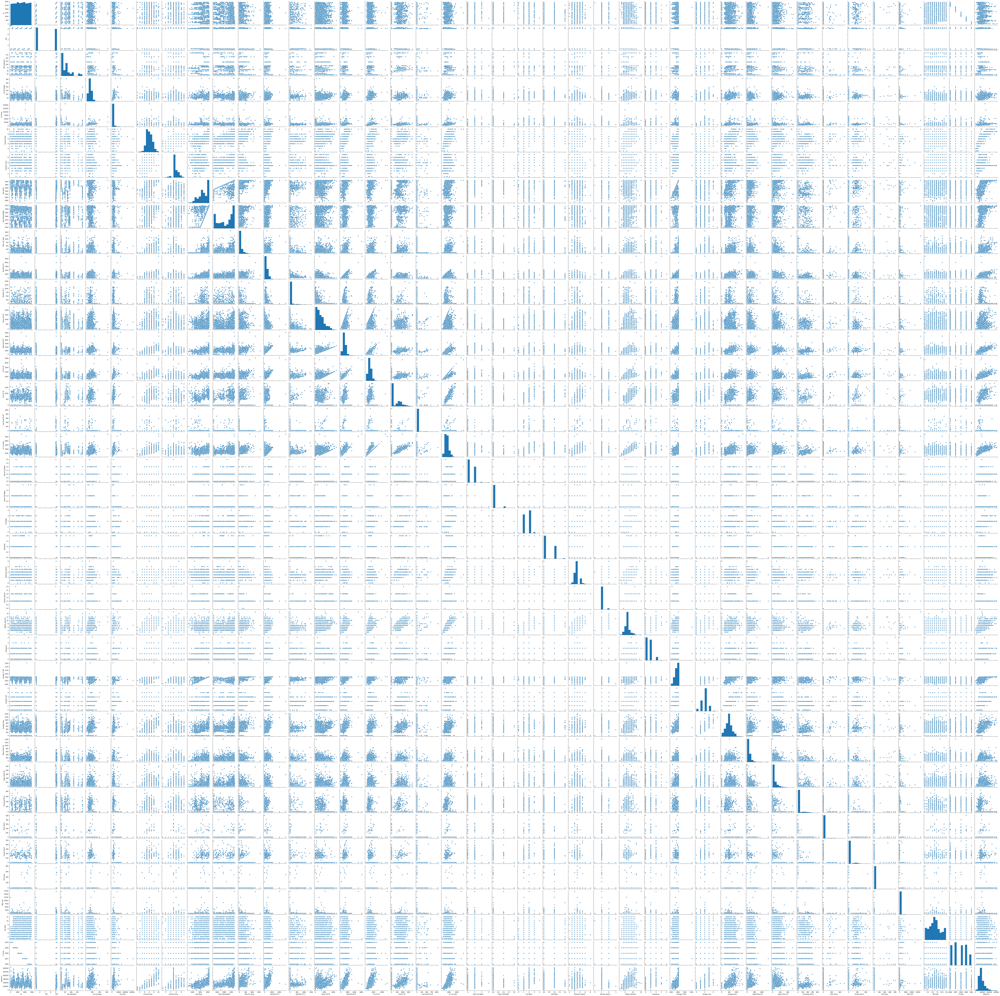

In [5]:
sns.pairplot(train)

In [9]:
full_data=pd.concat((train,test))

In [10]:
full_data

,Id,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,...,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
0,109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,3,2010,WD,130500.0
1,544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,4,2009,WD,220000.0
2,153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,1,2010,WD,109000.0
3,318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,4,2010,WD,174000.0
4,255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,...,0,0,NaN,NaN,NaN,0,3,2010,WD,138500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
873,1662,527377110,60,RL,80.0,8000,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,11,2007,WD,NaN
874,1234,535126140,60,RL,90.0,14670,Pave,NaN,Reg,Lvl,...,0,0,NaN,MnPrv,NaN,0,8,2008,WD,NaN
875,1373,904100040,20,RL,55.0,8250,Pave,NaN,Reg,Lvl,...,0,0,NaN,NaN,NaN,0,8,2008,WD,NaN
876,1672,527425140,20,RL,60.0,9000,Pave,NaN,Reg,Lvl,...,0,0,NaN,GdWo,NaN,0,5,2007,WD,NaN


In [18]:
# clean up the feature names for easier access later on

full_data.columns = full_data.columns.str.replace(" ","_")
full_data.columns = full_data.columns.str.replace("/","_")
full_data.columns = full_data.columns.str.lower()

In [20]:
# let's find out if we have any missing values

nulls = pd.DataFrame(full_data.isnull().sum())
nulls[nulls[0] != 0]

,0
lot_frontage,490
mas_vnr_type,23
mas_vnr_area,23
bsmt_qual,80
bsmt_cond,80
bsmt_exposure,83
bsmtfin_type_1,80
bsmtfin_sf_1,1
bsmtfin_type_2,81
bsmtfin_sf_2,1


After looking at our missing values we can determine a few features most likely have null values where None should be. Let's impute these manually.

In [12]:
full_data['alley'].value_counts()

Grvl    120
Pave     78
Name: Alley, dtype: int64

In [14]:
full_data['pool_qc'].value_counts()

Ex    4
Gd    4
TA    3
Fa    2
Name: Pool QC, dtype: int64

In [16]:
full_data['fireplace_qu'].value_counts()

Gd    743
TA    600
Fa     75
Po     46
Ex     43
Name: Fireplace Qu, dtype: int64

In [19]:
full_data['fence'].value_counts()

MnPrv    330
GdPrv    118
GdWo     112
MnWw      12
Name: fence, dtype: int64

In [13]:
full_data['alley'] = full_data['alley'].fillna('None')

In [15]:
full_data['pool_qc']= full_data['pool_qc'].fillna('None')

In [17]:
full_data['fireplace_qu'] = full_data['fireplace_qu'].fillna('None')

In [21]:
full_data['fence'] = full_data['fence'].fillna('None')

In [23]:
full_data['bsmt_qual'].value_counts()

TA    1283
Gd    1219
Ex     257
Fa      88
Po       2
Name: bsmt_qual, dtype: int64

In [25]:
full_data['misc_feature'].value_counts()

Shed    95
Gar2     5
Othr     4
TenC     1
Elev     1
Name: misc_feature, dtype: int64

In [26]:
full_data['misc_feature'] = full_data['misc_feature'].fillna('None')

In [27]:
full_data['lot_frontage'] = full_data['lot_frontage'].fillna('None')

In [55]:
# write function to examine categorical features with saleprice

def cat_plots(column):
    plt.figure(figsize=(12,6))
    plt.subplot(131)
    sns.swarmplot(full_data[column],full_data['saleprice'])
    
    plt.subplot(132)
    sns.boxplot(full_data[column],full_data['saleprice'])

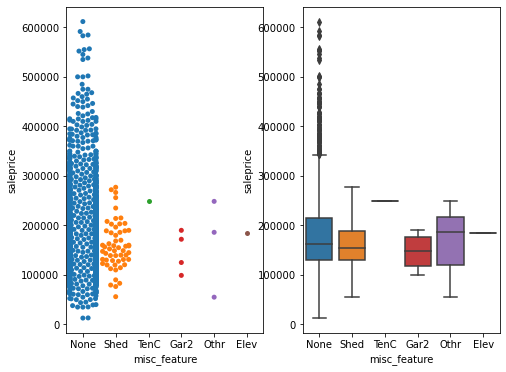

In [56]:
cat_plots('misc_feature')

In [41]:
categorical_features = [full_data.dtypes[full_data.dtypes == 'object']]

In [48]:
categorical_features

[ms_zoning         object
 lot_frontage      object
 street            object
 alley             object
 lot_shape         object
 land_contour      object
 utilities         object
 lot_config        object
 land_slope        object
 neighborhood      object
 condition_1       object
 condition_2       object
 bldg_type         object
 house_style       object
 roof_style        object
 roof_matl         object
 exterior_1st      object
 exterior_2nd      object
 mas_vnr_type      object
 exter_qual        object
 exter_cond        object
 foundation        object
 bsmt_qual         object
 bsmt_cond         object
 bsmt_exposure     object
 bsmtfin_type_1    object
 bsmtfin_type_2    object
 heating           object
 heating_qc        object
 central_air       object
 electrical        object
 kitchen_qual      object
 functional        object
 fireplace_qu      object
 garage_type       object
 garage_finish     object
 garage_qual       object
 garage_cond       object
 paved_drive

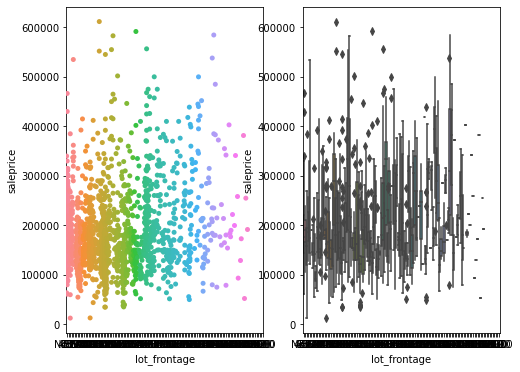

In [57]:
cat_plots('lot_frontage')     

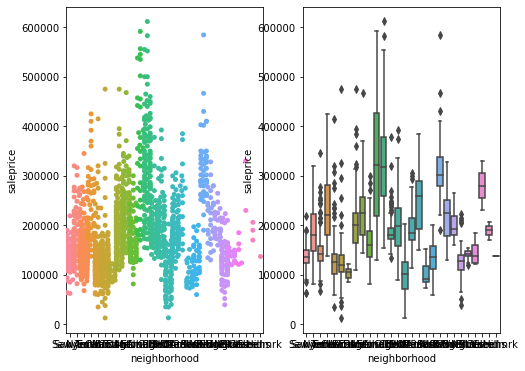

In [58]:
cat_plots('neighborhood')

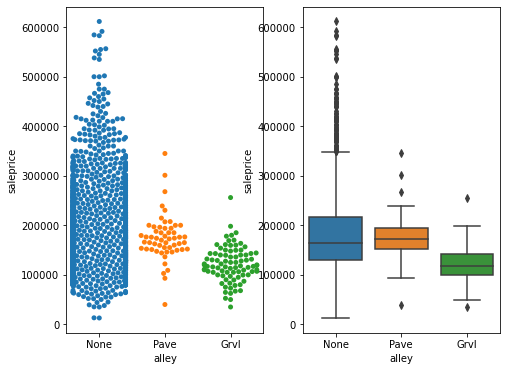

In [59]:
cat_plots('alley')

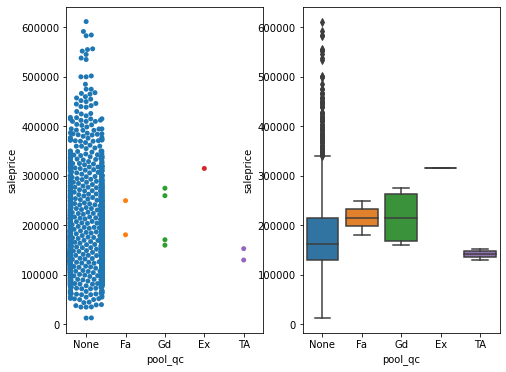

In [60]:
cat_plots('pool_qc')

In [64]:
numeric_cols = full_data.dtypes[full_data.dtypes != 'object']

In [65]:
numeric_cols

id                   int64
pid                  int64
ms_subclass          int64
lot_area             int64
overall_qual         int64
overall_cond         int64
year_built           int64
year_remod_add       int64
mas_vnr_area       float64
bsmtfin_sf_1       float64
bsmtfin_sf_2       float64
bsmt_unf_sf        float64
total_bsmt_sf      float64
1st_flr_sf           int64
2nd_flr_sf           int64
low_qual_fin_sf      int64
gr_liv_area          int64
bsmt_full_bath     float64
bsmt_half_bath     float64
full_bath            int64
half_bath            int64
bedroom_abvgr        int64
kitchen_abvgr        int64
totrms_abvgrd        int64
fireplaces           int64
garage_yr_blt      float64
garage_cars        float64
garage_area        float64
wood_deck_sf         int64
open_porch_sf        int64
enclosed_porch       int64
3ssn_porch           int64
screen_porch         int64
pool_area            int64
misc_val             int64
mo_sold              int64
yr_sold              int64
s

In [61]:
# make a function to examine numerical feature relationships with sale price

def num_plots(column):
    plt.figure(figsize=(10,6))
    
    plt.subplot(121)
    sns.scatterplot(full_data[column],full_data['saleprice'])
    
    plt.subplot(122)
    sns.regplot(full_data[column],full_data['saleprice'])

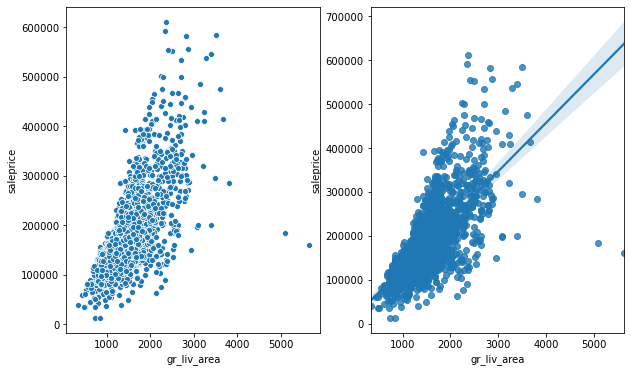

In [66]:
num_plots('gr_liv_area')

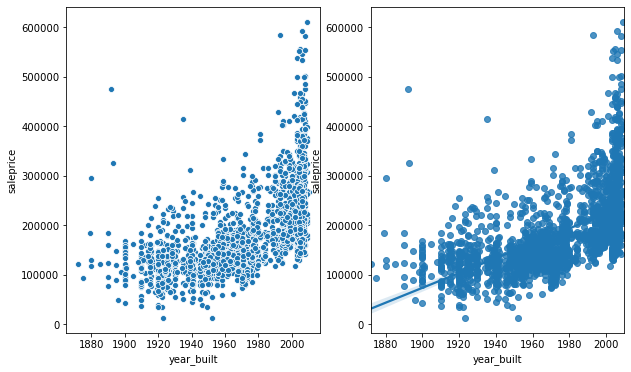

In [67]:
num_plots('year_built')

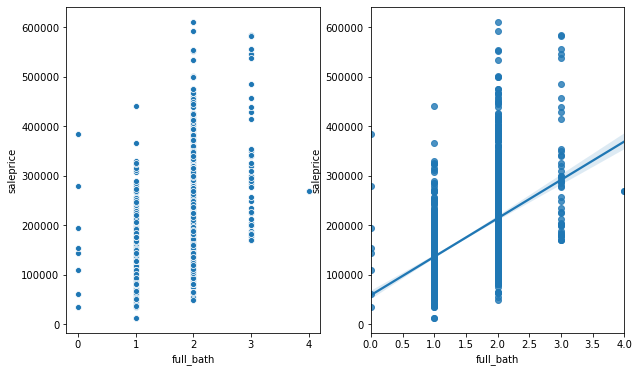

In [68]:
num_plots('full_bath')

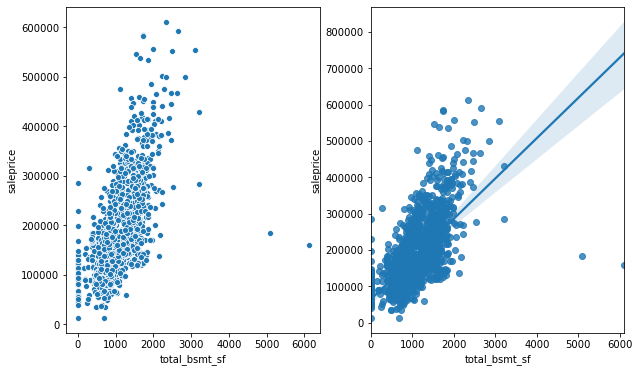

In [70]:
num_plots('total_bsmt_sf')

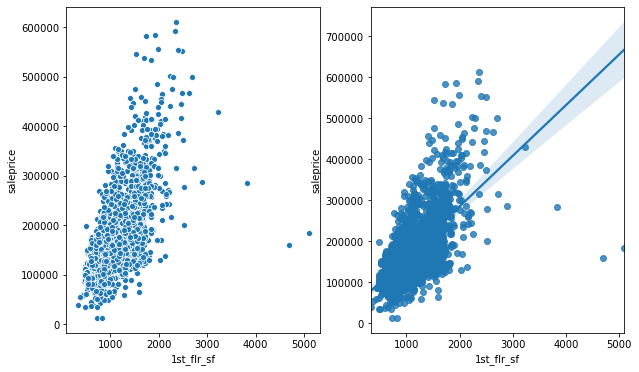

In [72]:
num_plots('1st_flr_sf')

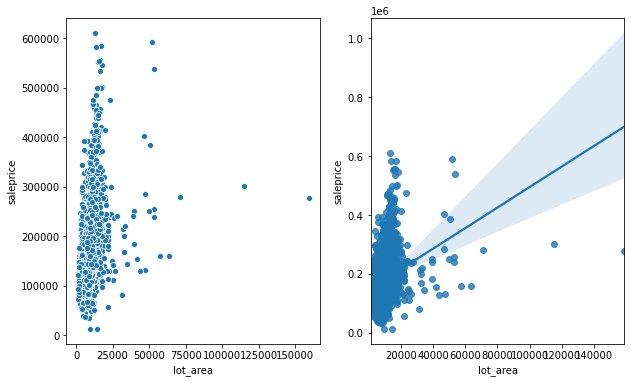

In [73]:
num_plots('lot_area')